In [1]:
##Importing packages we need##

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import NaturalEarthFeature
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.animation import FuncAnimation
from matplotlib import cm
from matplotlib.cm import get_cmap
import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap
import metpy.calc as mpcalc
from metpy.units import units
from numpy import *
import xarray as xr
from netCDF4 import Dataset, num2date
import math
import pygrib
import cdsapi
import imageio
import os
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
import metpy as mp
import warnings
import glob
import dask
warnings.filterwarnings("ignore")

print("Done importing modules")

Done importing modules


In [25]:
##Declare time, level, lat/lon boundaries and loop through a 2-day period for Frontal Analysis##

#Area and Time#
colorado_area = [44, -112, 34, -99]  #some buffer on all sides
latN = 44
latS = 34
lonW = -112    #Must be in degrees E (The western hemisphere is captured between 180 and 360 degrees east)
lonE = -99
level = 850    #What level do we want to look at FLF on   

2024-04-19 08:51:05,083 INFO Welcome to the CDS
2024-04-19 08:51:05,083 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/reanalysis-era5-single-levels
2024-04-19 08:51:05,269 INFO Request is queued
2024-04-19 08:51:06,416 INFO Request is running
2024-04-19 08:51:08,063 INFO Request is completed
2024-04-19 08:51:08,063 INFO Downloading https://download-0015-clone.copernicus-climate.eu/cache-compute-0015/cache/data5/adaptor.mars.internal-1713538266.897234-12456-2-87d12a90-bf98-4387-8897-db3eb1086ce4.nc to temporary_surface_20070104_0000sfc.nc (28.2K)
2024-04-19 08:51:08,954 INFO Download rate 31.7K/s  
2024-04-19 08:51:09,259 INFO Welcome to the CDS
2024-04-19 08:51:09,259 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/reanalysis-era5-single-levels
2024-04-19 08:51:09,447 INFO Request is queued
2024-04-19 08:51:10,594 INFO Request is running
2024-04-19 08:51:12,241 INFO Request is completed
2024-04-19 08:51:12,241 INFO Downloading htt

DatetimeIndex(['2007-01-04 00:00:00', '2007-01-04 01:00:00',
               '2007-01-04 02:00:00', '2007-01-04 03:00:00',
               '2007-01-04 04:00:00', '2007-01-04 05:00:00',
               '2007-01-04 06:00:00', '2007-01-04 07:00:00',
               '2007-01-04 08:00:00', '2007-01-04 09:00:00',
               '2007-01-04 10:00:00', '2007-01-04 11:00:00',
               '2007-01-04 12:00:00', '2007-01-04 13:00:00',
               '2007-01-04 14:00:00', '2007-01-04 15:00:00',
               '2007-01-04 16:00:00', '2007-01-04 17:00:00',
               '2007-01-04 18:00:00', '2007-01-04 19:00:00',
               '2007-01-04 20:00:00', '2007-01-04 21:00:00',
               '2007-01-04 22:00:00', '2007-01-04 23:00:00',
               '2007-01-05 00:00:00', '2007-01-05 01:00:00',
               '2007-01-05 02:00:00', '2007-01-05 03:00:00',
               '2007-01-05 04:00:00', '2007-01-05 05:00:00',
               '2007-01-05 06:00:00', '2007-01-05 07:00:00',
               '2007-01-

In [3]:
##Import the Test Case##

ds_sfc = xr.open_dataset('ERA5_Feb17_Case.nc').metpy.parse_cf()
ds_sfc

<xarray.Dataset>
Dimensions:    (longitude: 53, latitude: 41, time: 96)
Coordinates:
  * longitude  (longitude) float32 -112.0 -111.8 -111.5 ... -99.5 -99.25 -99.0
  * latitude   (latitude) float32 44.0 43.75 43.5 43.25 ... 34.5 34.25 34.0
  * time       (time) datetime64[ns] 2017-02-11 ... 2017-02-14T23:00:00
    metpy_crs  object Projection: latitude_longitude
Data variables:
    u10        (time, latitude, longitude) float32 ...
    v10        (time, latitude, longitude) float32 ...
    d2m        (time, latitude, longitude) float32 ...
    t2m        (time, latitude, longitude) float32 ...
    msl        (time, latitude, longitude) float32 ...
    sp         (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-03-04 23:40:44 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [4]:
##Load in the datasets and read in variables and cords##

#This is for the surface level#
dew_2m = ds_sfc.d2m.metpy.sel(latitude=slice(latN,latS),longitude=slice(lonW,lonE))
uwnd_10m = ds_sfc.u10.metpy.sel(latitude=slice(latN,latS),longitude=slice(lonW,lonE))
vwnd_10m = ds_sfc.v10.metpy.sel(latitude=slice(latN,latS),longitude=slice(lonW,lonE))
tmpk_2m = ds_sfc.t2m.metpy.sel(latitude=slice(latN,latS),longitude=slice(lonW,lonE))
mslp = ds_sfc.msl.metpy.sel(latitude=slice(latN,latS),longitude=slice(lonW,lonE))
sfc_p = ds_sfc.sp.metpy.sel(latitude=slice(latN,latS),longitude=slice(lonW,lonE))

#Extract Coordinates#
lats = ds_sfc.latitude.metpy.sel(latitude=slice(latN,latS))
lons = ds_sfc.longitude.metpy.sel(longitude=slice(lonW,lonE))
lons_2D, lats_2D = meshgrid(lons,lats)
dx, dy = mpcalc.lat_lon_grid_deltas(lons, lats)

tmpk_2m

<xarray.DataArray 't2m' (time: 96, latitude: 41, longitude: 53)>
[208608 values with dtype=float32]
Coordinates:
  * longitude  (longitude) float32 -112.0 -111.8 -111.5 ... -99.5 -99.25 -99.0
  * latitude   (latitude) float32 44.0 43.75 43.5 43.25 ... 34.5 34.25 34.0
  * time       (time) datetime64[ns] 2017-02-11 ... 2017-02-14T23:00:00
    metpy_crs  object Projection: latitude_longitude
Attributes:
    units:      K
    long_name:  2 metre temperature

In [5]:
##Apply a spatial smoother to the variables so that synoptic-scale signals can be more readily observed (25)##

smoothing_var = 15

#Surface variables#
dew_2m = mpcalc.smooth_gaussian(dew_2m, smoothing_var)
uwnd_10m = mpcalc.smooth_gaussian(uwnd_10m, smoothing_var)
vwnd_10m = mpcalc.smooth_gaussian(vwnd_10m, smoothing_var)
tmpk_2m = mpcalc.smooth_gaussian(tmpk_2m, smoothing_var)
mslp = mpcalc.smooth_gaussian(mslp, smoothing_var)
sfc_p = mpcalc.smooth_gaussian(sfc_p, smoothing_var)


In [6]:
##Calculate additional variables to plot##

#Surface level variables#
thetaE = mpcalc.equivalent_potential_temperature(sfc_p, tmpk_2m, dew_2m) 
thetaE_adv = mpcalc.advection(thetaE, uwnd_10m, vwnd_10m)

#geo_10m = mpcalc.geostrophic_wind(hght,dx=dx,dy=dy,latitude=lats_2D*units.degrees)   #Geostrophic wind
#age_10m = mpcalc.ageostrophic_wind(hght,uwnd,vwnd,dx=dx,dy=dy,latitude=lats)    #Ageostrophic wind
#ug_10m, vg_10m = geo_10m[0], geo_10m[1]
#ua_10m, va_10m = age_10m[0], age_10m[1]

#np.nanmin(thetaE_adv_s), np.nanmax(thetaE_adv_s)

In [7]:
##Scale the thetaE advection and only select cold air advection values##

#Scale by a factor#
thetaE_adv_s = thetaE_adv * 1e4

#Select only CAA and WAA#
thetaE_adv_s_CAA = thetaE_adv_s.where(thetaE_adv_s < 0, other=np.nan)
thetaE_adv_s_WAA = thetaE_adv_s.where(thetaE_adv_s > 0, other=np.nan)

thetaE_adv_s

<xarray.DataArray (time: 96, latitude: 41, longitude: 53)>
<Quantity([[[ 4.84925179e-02 -7.66919518e-02 -2.08187706e-01 ... -1.29851904e-01
   -1.62999579e-01 -2.04620855e-01]
  [ 2.15173927e-01  9.00474948e-02 -4.71341694e-02 ... -5.77609809e-01
   -5.89586324e-01 -6.18190548e-01]
  [ 3.19517243e-01  1.97080199e-01  5.44251990e-02 ... -1.03784228e+00
   -1.02580946e+00 -1.03948180e+00]
  ...
  [ 5.56864049e-01  5.90745592e-01  6.51268628e-01 ...  1.73238374e-01
    3.35075229e-01  4.36019966e-01]
  [ 3.61212041e-01  3.83533660e-01  4.27869355e-01 ...  1.10636038e-01
    2.37185392e-01  3.23911333e-01]
  [ 1.56192561e-01  1.69726100e-01  1.98438016e-01 ...  6.85689796e-03
    8.58042784e-02  1.48507279e-01]]

 [[ 2.53580262e-02 -7.15318685e-02 -1.68885437e-01 ... -7.99801776e-02
   -1.43091001e-01 -2.11538417e-01]
  [ 1.37774436e-01  4.39388134e-02 -5.62293214e-02 ... -5.37807308e-01
   -5.79300896e-01 -6.36604555e-01]
  [ 2.10540907e-01  1.24889846e-01  2.53804856e-02 ... -9.89080421e-01
   -9.97988665e-01 -1.03709964e+00]
...
  [ 1.21747580e-02  4.34097347e-05 -3.79735007e-02 ...  1.61429503e-01
    3.86735187e-02 -5.92916536e-02]
  [ 2.29798927e-02  2.00248385e-02  4.41965042e-03 ...  1.90356143e-02
   -9.49648031e-02 -1.82092358e-01]
  [ 1.58247957e-02  1.74981483e-02  2.00973999e-02 ... -1.68126005e-02
   -1.03828322e-01 -1.71760923e-01]]

 [[-1.12321521e-01 -2.53044943e-01 -3.70525516e-01 ...  1.48721407e-01
    5.90368257e-02 -4.10396474e-02]
  [-1.19304456e-01 -2.48590389e-01 -3.55311804e-01 ... -2.28620307e-02
   -1.09274718e-01 -2.05830384e-01]
  [-1.14169972e-01 -2.23599088e-01 -3.12181601e-01 ... -2.17971363e-01
   -2.97669527e-01 -3.87597529e-01]
  ...
  [-1.31081022e-02 -1.43320697e-03 -1.89724688e-02 ...  5.91197890e-01
    5.26823740e-01  4.58558911e-01]
  [ 2.21682025e-02  4.81160193e-02  5.29107103e-02 ...  4.09275066e-01
    3.32542349e-01  2.57067234e-01]
  [ 3.51594129e-02  7.07647623e-02  9.49933033e-02 ...  2.37889251e-01
    1.56873188e-01  7.97932877e-02]]], 'kelvin / second')>
Coordinates:
  * longitude  (longitude) float32 -112.0 -111.8 -111.5 ... -99.5 -99.25 -99.0
  * latitude   (latitude) float32 44.0 43.75 43.5 43.25 ... 34.5 34.25 34.0
  * time       (time) datetime64[ns] 2017-02-11 ... 2017-02-14T23:00:00
    metpy_crs  object Projection: latitude_longitude

In [8]:
##Calculate Front Locator Function (FLF) using ThetaE##

def calculate_flf(thetaE, dx, dy):
    '''Make an FLF function to calculate it for all gridpoints at each timestep.'''
    
    #Step 1: Calculate the gradient of thetaE#
    d0_dy, d0_dx = mpcalc.gradient(thetaE, deltas=(dy, dx)) 
    
    #Step 2: Calculate the magnitude of the gradient#
    mag_grad_thetaE = np.sqrt((d0_dx**2) + (d0_dy**2))  # |grad(thetaE)|
    
    #Step 3a: Calculate the gradient of the magnitude#
    grad_step2_y, grad_step2_x = mpcalc.gradient(mag_grad_thetaE, deltas=(dy, dx))
    
    #Step 3b: Redo but for Qn component only#
    qx = grad_step2_x.copy()
    qy = grad_step2_y.copy()
    denominator = ((d0_dx) * (d0_dx)) + ((d0_dy) * (d0_dy))

    Qn_x = (((qx) * (d0_dx) * (d0_dx)) + ((qy) * (d0_dy) * (d0_dx))) / (denominator)  #i component
    Qn_y = (((qx) * (d0_dx) * (d0_dy)) + ((qy) * (d0_dy) * (d0_dy))) / (denominator)  #j component
    #Qn_low = Qn_x + Qn_y
    #Qn = Qn_low * 1e10
    
    #Step 4: Calculate the divergence of the gradient of the magnitude with Qn component#
    div_step4_Qn = mpcalc.divergence(Qn_x, Qn_y, dx=dx, dy=dy)
    div_step4_Qn_convert = div_step4_Qn * 1e14  #What we need
    
    return div_step4_Qn_convert

#Apply the function across all timesteps now#
FLF_data = xr.apply_ufunc(
    calculate_flf, 
    thetaE, 
    input_core_dims=[['latitude', 'longitude']],  #Core dimensions over which to apply the function
    output_core_dims=[['latitude', 'longitude']], #Core dimensions on the output
    vectorize=True,  #Automatically vectorize the computation if needed
    dask='parallelized',  #Use Dask for parallel computation if thetaE is a Dask-backed array
    kwargs={'dx': dx, 'dy': dy})  #Additional keyword arguments for the function

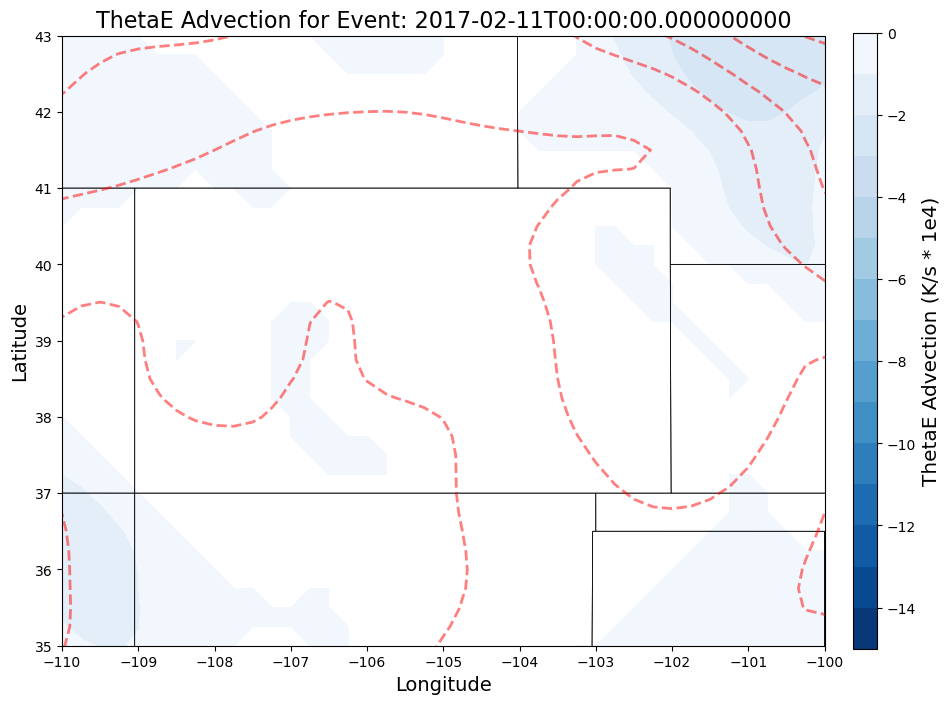

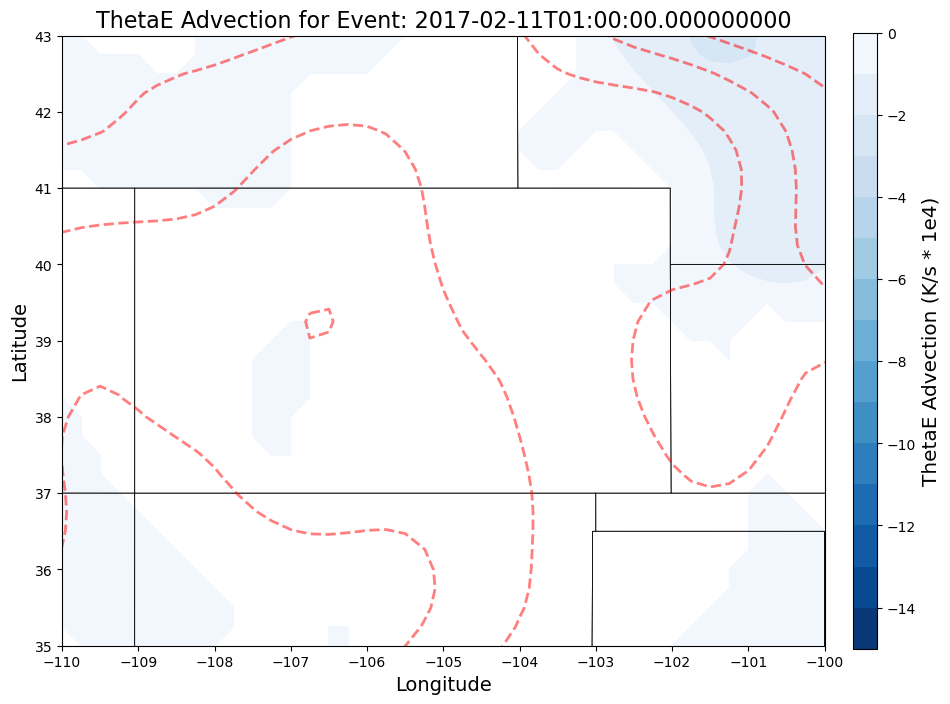

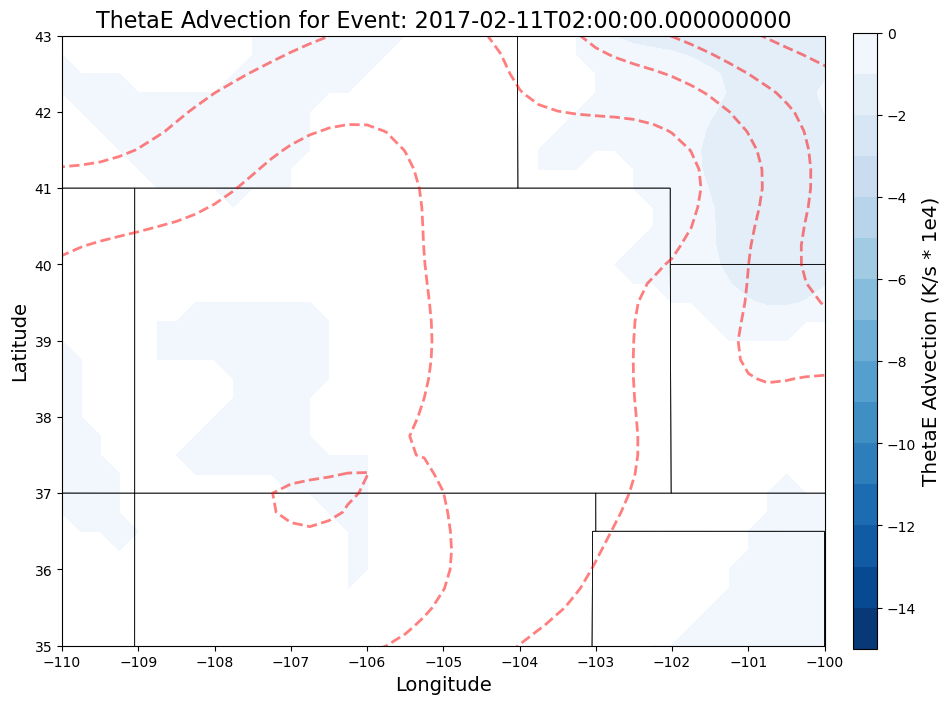

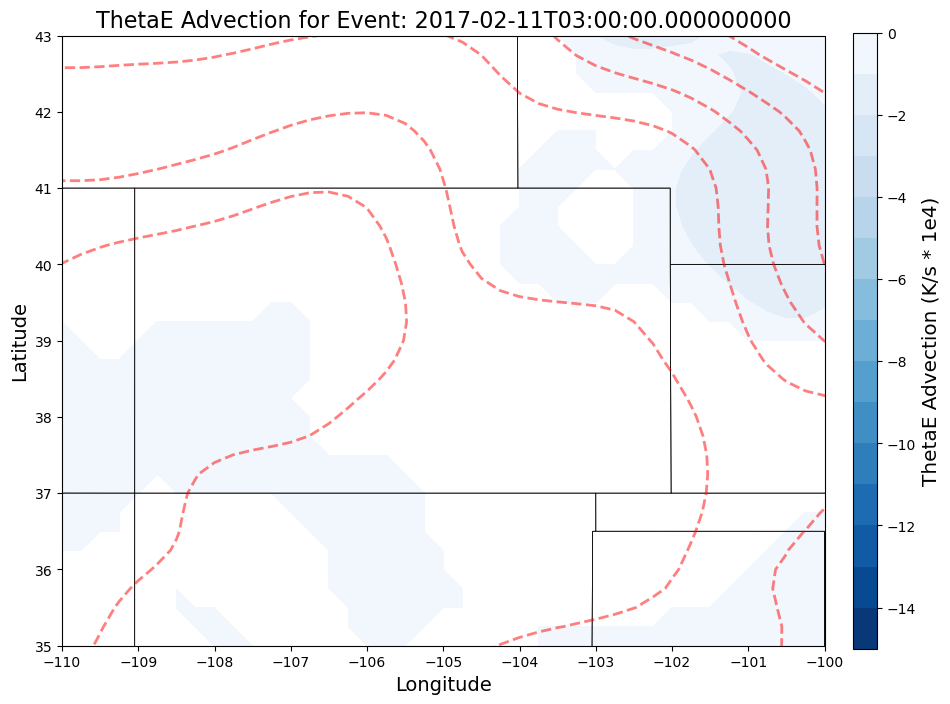

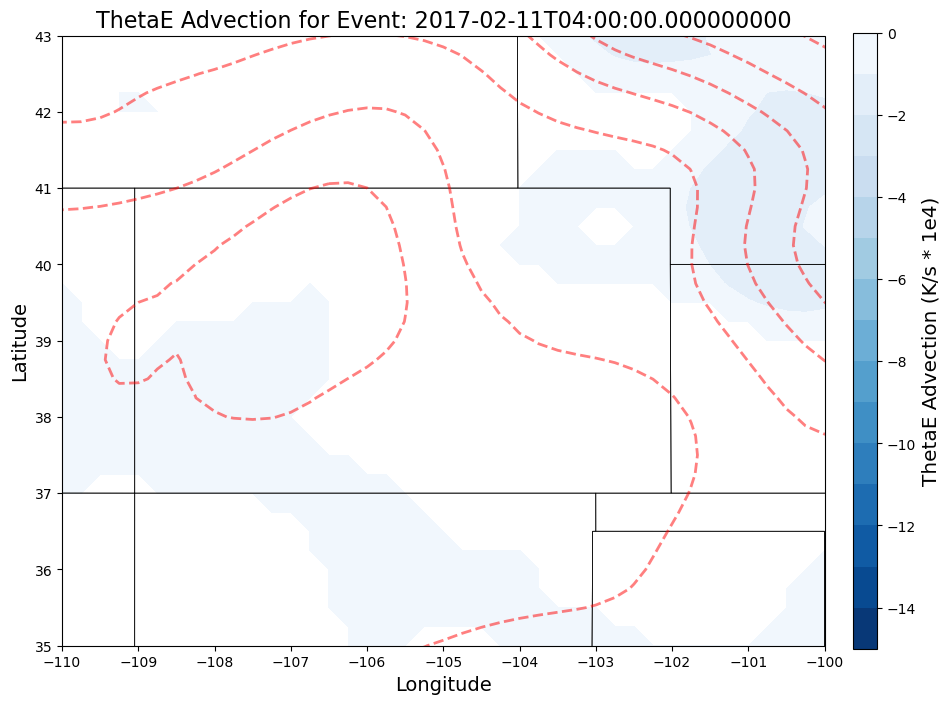

...

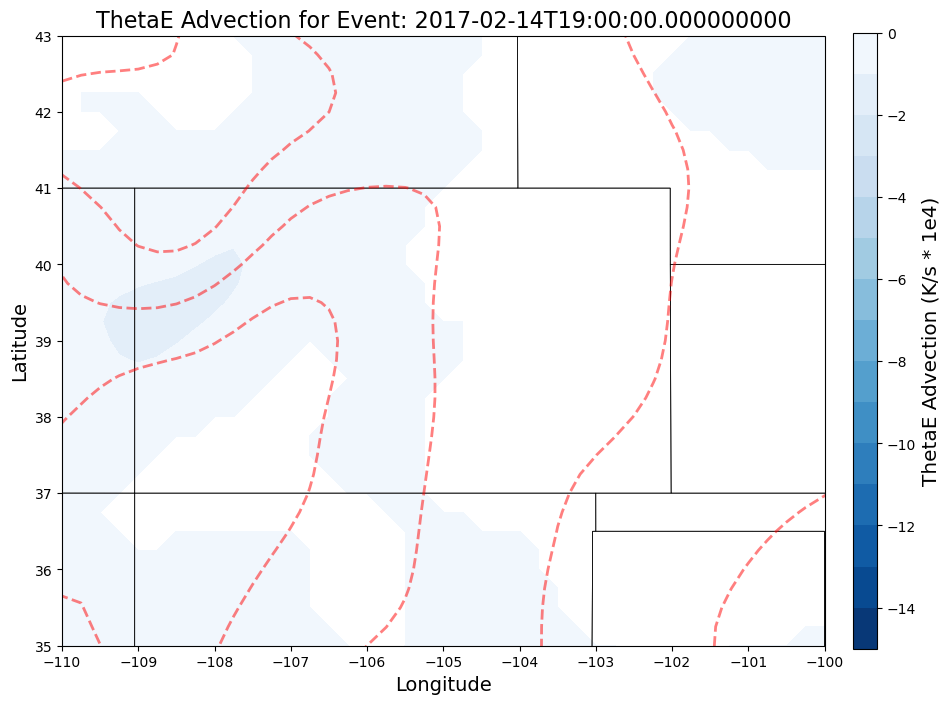

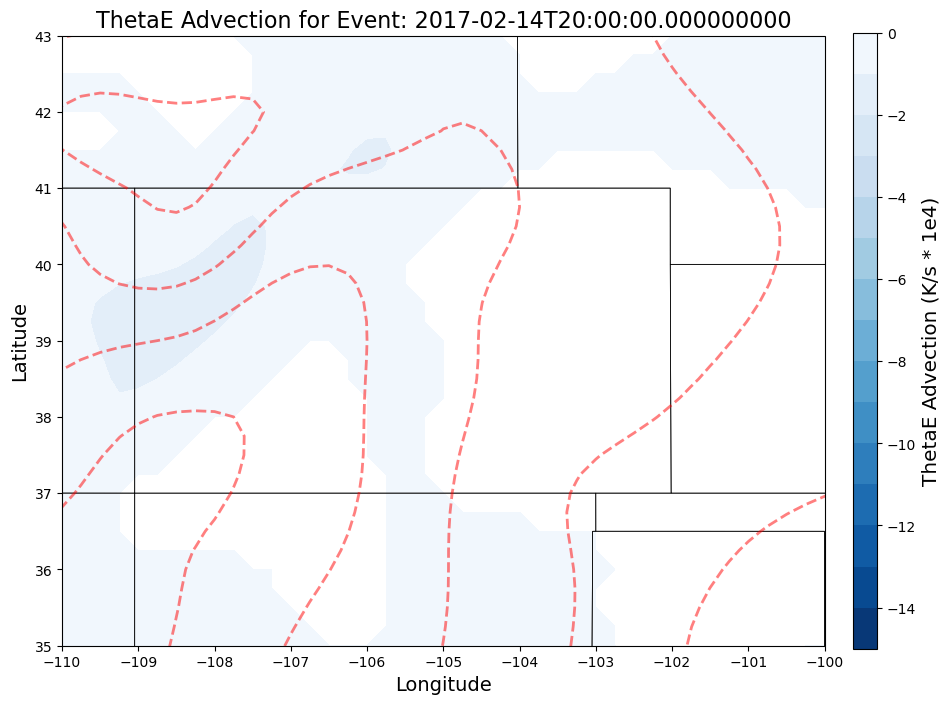

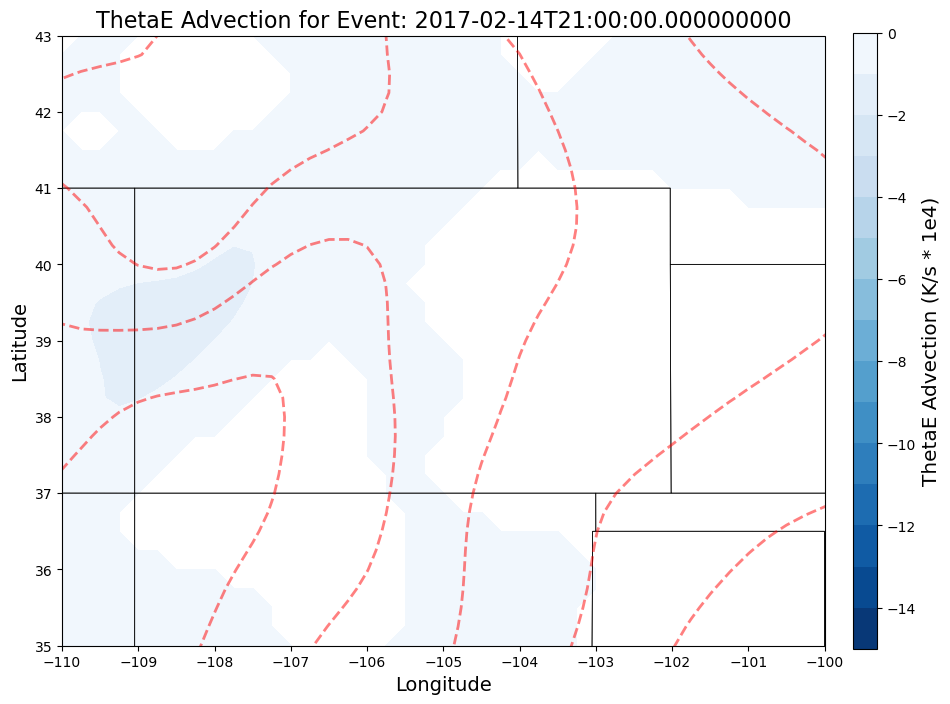

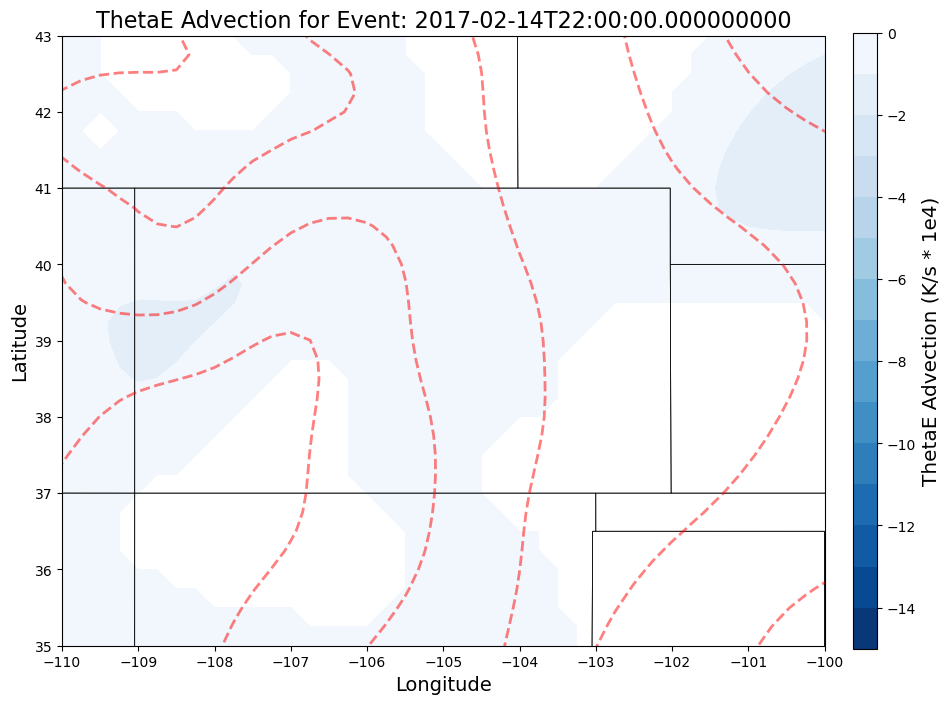

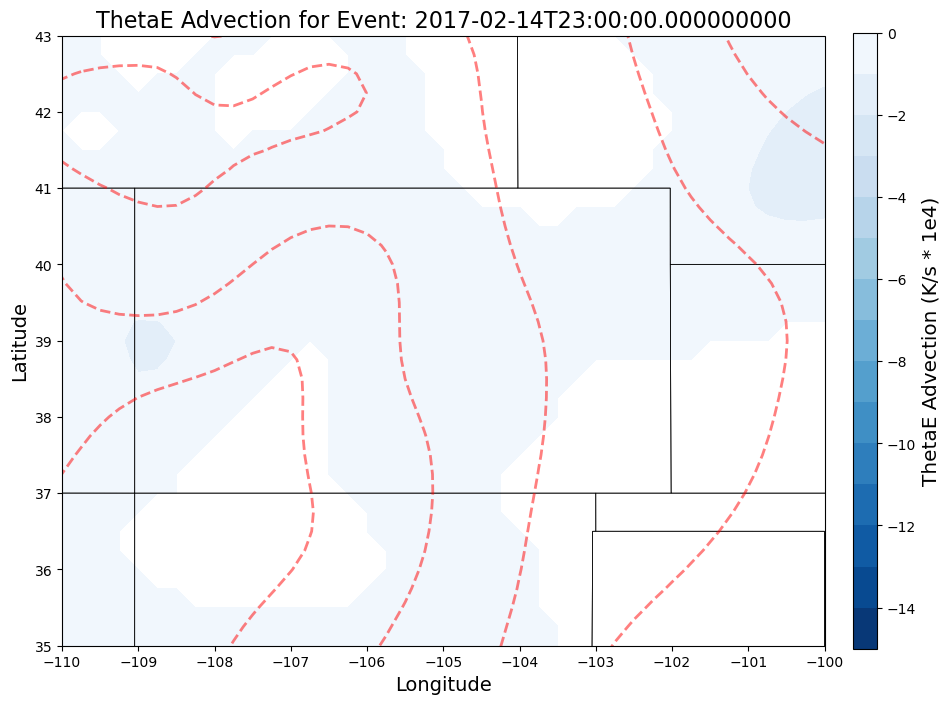

In [9]:
##Loop through each timestep and plot FLF##

for i, time in enumerate(FLF_data['time']):
    
    #Setting up the plotting map and map projection#
    mapcrs = ccrs.LambertConformal(central_longitude=-55, central_latitude=45, standard_parallels=(33, 45)) 
    mapcrs = ccrs.PlateCarree()

    #Set up the projection of the data; if lat/lon then PlateCarree is what you want#
    datacrs = ccrs.PlateCarree()

    #Start the figure and create plot axes with proper projection#
    fig = plt.figure(1, figsize=(12, 10)) 
    ax = plt.subplot(111, projection=mapcrs) 
    ax.set_extent([-110, -100, 35, 43], ccrs.PlateCarree())  #-110, -100, 35, 43 | -110, -60, 20, 60

    #Add geopolitical boundaries for map reference#
    ax.add_feature(cfeature.LAND, facecolor="white") 
    countries = NaturalEarthFeature(category="cultural", scale="110m", facecolor="none", name="admin_0_boundary_lines_land") 
    ax.add_feature(countries, linewidth=0.5, edgecolor="black") 
    ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.5) 
    ax.coastlines('50m', linewidth=0.8)
  
    #Data to plot
    FLFs = FLF_data.sel(time=time)
    FLFs_th = FLFs.where(FLFs <= -0.1, other=np.nan)
    Theta_Es = thetaE.sel(time=time)
    thetaE_advs = thetaE_adv_s_CAA.sel(time=time)
    
    #Set up contour and fill intervals#
    Qn_levels = arange(-5.5, 0.5, 0.5) 
    thetaE_levels = arange(250,400,4)
    thetaE_adv_levels = arange(-15,1,1)
    #thetaE_adv_levels = arange(0,7.5,0.5)

    #Create the plot
    FLF_fconts = plt.contourf(lons, lats, FLFs_th, levels=Qn_levels, cmap='viridis', alpha=1, transform=ccrs.PlateCarree())
    #thetaE_adv_fconts = plt.contourf(lons, lats, thetaE_advs, levels=thetaE_adv_levels, cmap='Blues_r', alpha=1, transform=ccrs.PlateCarree())
    thetaE_conts = plt.contour(lons, lats, Theta_Es, levels=thetaE_levels, colors="red", alpha=0.5, linestyles='dashed',linewidths=2.0, transform=ccrs.PlateCarree())
    
    #Colorbar and contour labels#
    cb = fig.colorbar(FLF_fconts, orientation='vertical', pad=0.03, extendrect=True, aspect=25, shrink=0.8)
    cb.set_label('Scaled FLF (K/m^3 * 1e14)', size='x-large')
#     cb = fig.colorbar(thetaE_adv_fconts, orientation='vertical', pad=0.03, extendrect=True, aspect=25, shrink=0.8)
#     cb.set_label('ThetaE Advection (K/s * 1e4)', size='x-large')

    #Set titles and labels
    ax.set_xticks(range(-110, -99, 1), crs=ccrs.PlateCarree())
    ax.set_yticks(range(35, 44, 1), crs=ccrs.PlateCarree())
    ax.set_xlabel('Longitude', fontsize=14)
    ax.set_ylabel('Latitude', fontsize=14)
    ax.set_title(f'FLF for Event: {str(time.values)}', fontsize=16) 
    
    plt.show()

    #Save the current frame
    #plt.savefig(f'frame_CAA_{i:04d}.png')
    plt.close()

In [10]:
# #Now make those 48 figures into a gif##

# #Specify the directory where your images are located
# image_folder = '/projects/zami4053/Synoptic_Research/'
# images = []

# #Gather the file names of the PNGs
# for file_name in sorted(os.listdir(image_folder)):
#     if file_name.endswith('.png'):
#         file_path = os.path.join(image_folder, file_name)
#         images.append(imageio.imread(file_path))

# # Save the images as a GIF
# imageio.mimsave('/projects/zami4053/Synoptic_Research/D22_WAA.gif', images, fps=5)  # Adjust fps to your liking

In [11]:
##See the CF dataset and some days to select##

ds_CF = xr.open_dataset('CF_xr.nc').metpy.parse_cf()
ds_CF

CF_case2plot = ds_CF.sel(time = FLF_data['time'][47], method='nearest')
CF_case2plot

<xarray.Dataset>
Dimensions:          (longitude: 14, latitude: 17)
Coordinates:
  * longitude        (longitude) float32 -105.2 -105.0 -104.8 ... -102.2 -102.0
  * latitude         (latitude) float32 41.0 40.75 40.5 ... 37.5 37.25 37.0
    time             datetime64[ns] 2017-02-13
    metpy_crs        object Projection: latitude_longitude
Data variables:
    Daily_Max_Temps  (latitude, longitude) float32 ...
    Temp_Diffs       (latitude, longitude) float32 ...
    CF_Dataset       (latitude, longitude) float64 ...

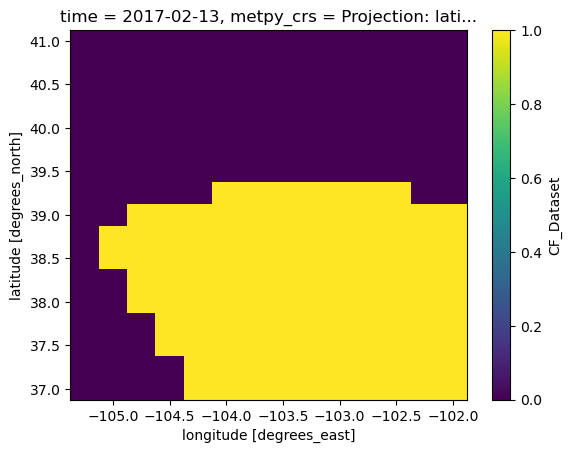

In [12]:
CF_case2plot['CF_Dataset'].plot()

Domain minimized: (38.25, 39.75, -104.0, -102.25)


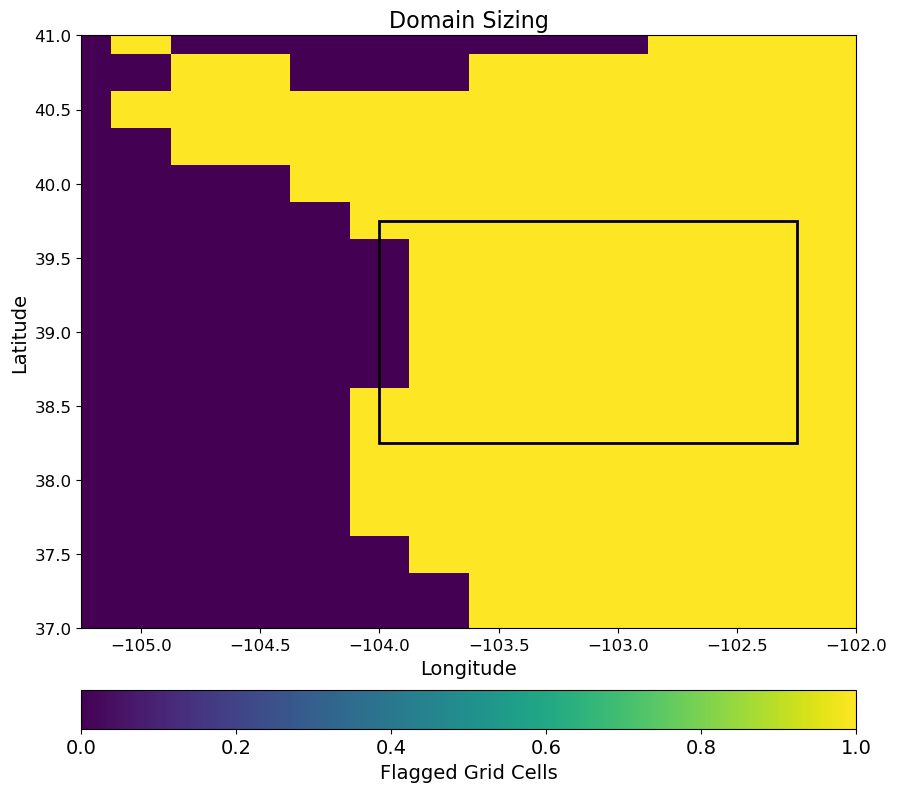

In [13]:
##Testing out continous shapes in Eastern CO that contain >=1 grid cell from all cold front days##

#Define the entire domain
testing_domain = [41, -105.25, 37.0, -102.0]

#Function to test the subregion for all cases#
def test_subregion(ds, lat_min, lat_max, lon_min, lon_max):
    '''This function will see whether a specific subregion contains >=1 flagged cell for alll 735 cases'''
    
    #Select the subregion to test#
    subregion = ds.sel(latitude=slice(lat_max, lat_min), longitude=slice(lon_min, lon_max))
    
    #Loop thru all cases#
    for i in range(len(subregion['time'])):
        
        #Check to see if there are any cases that don't have any flagged cells#
        if np.sum(subregion['CF_Dataset'][i].values) == 0:
            
            return False
        
    return True


#Function to find the smallest subregion for rectangles, thanks chatgpt#
def find_smallest_subregion(ds, domain):
    '''Find the smallest subregion by iterating'''
    
    #Extract domain values and define a step reduction per iteration
    lat_min, lon_min, lat_max, lon_max = domain
    step = 0.25 
    
    #Start with large domain and reduce until condition is not met#
    while True:
        
        if not test_subregion(ds, lat_min, lat_max, lon_min, lon_max):
            
            break  #Stop if the condition is not met
        
        #Reduce the domain size and test again#
        lat_min += step
        lat_max -= step
        lon_min += step
        lon_max -= step
    
    #Return the last valid subregion that met the condition#
    return lat_min-step, lat_max+step, lon_min-step, lon_max+step

sub_test = test_subregion(ds_CF, testing_domain[2], testing_domain[0], testing_domain[1], testing_domain[3])
#print(sub_test)

sub_test_optimize = find_smallest_subregion(ds_CF, (38.0, -104.25, 40.0, -102.0))  #37.0, -105.25, 41.0, -102.0
print(f"Domain minimized: {sub_test_optimize}")
smallest_subregion = list(sub_test_optimize).copy()


#Plotting##
fig, ax = plt.subplots(1, figsize=(10,10))
domain_cf = plt.pcolormesh(ds_CF.longitude, ds_CF.latitude, ds_CF['CF_Dataset'][100], cmap='viridis', alpha=1)
cbar = plt.colorbar(domain_cf, orientation='horizontal', pad=0.08)

ax.set_xlabel('Longitude', fontsize=14)
ax.set_ylabel('Latitude', fontsize=14)
ax.set_title('Domain Sizing', fontsize=16)
ax.set_xlim([-105.25, -102])  #can turn off
ax.set_ylim([37,41])          #can turn off
ax.tick_params(labelsize=12)
cbar.set_label(label='Flagged Grid Cells', size=14)
cbar.ax.tick_params(labelsize=14)

#Add a rectangle around the subregion found#
rect_domain = patches.Rectangle(
    
    (smallest_subregion[2], smallest_subregion[0]), #(lon_min, lat_min)
    smallest_subregion[3] - smallest_subregion[2],  #width (lon_max - lon_min)
    smallest_subregion[1] - smallest_subregion[0],  #height (lat_max - lat_min)
    linewidth=2,
    edgecolor='black',
    facecolor='none'
)

ax.add_patch(rect_domain)

plt.show()

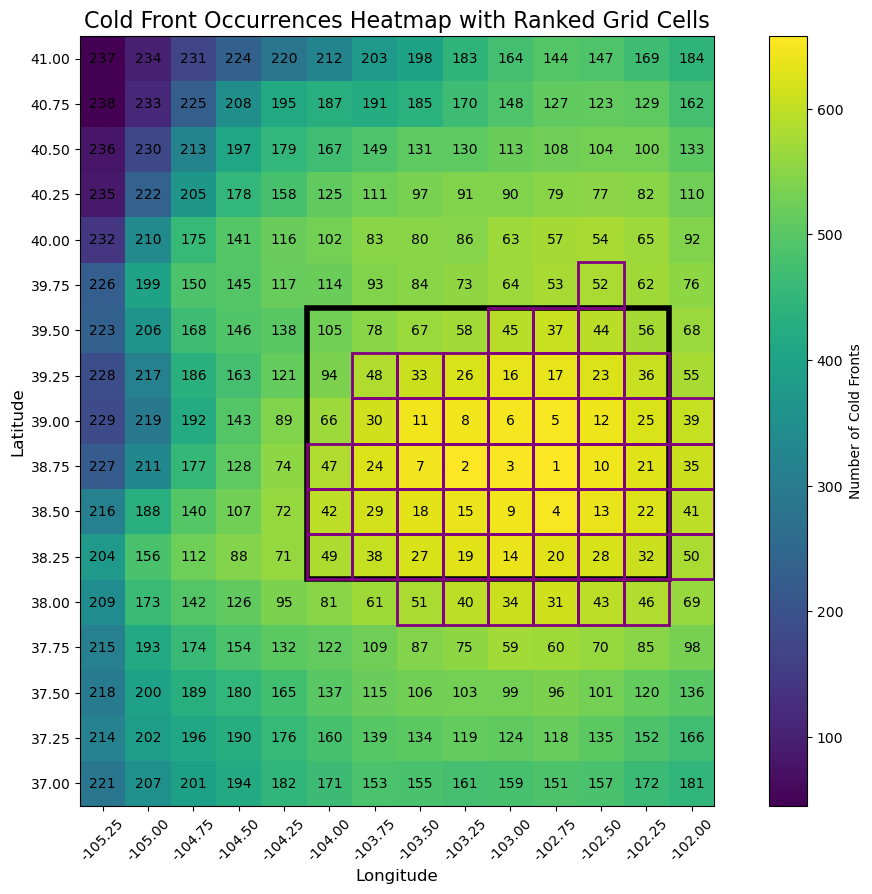

In [14]:
##The grid cell ranking method##

#Remake the spatial heatmap#
cold_front_counts = ds_CF['CF_Dataset'].sum(dim='time')

#Sort the counts to obtain ranks for each grid cell#
flattened_counts = cold_front_counts.values.flatten()
sorted_indices = np.argsort(-flattened_counts)  #Negative for descending sort

ranks = np.empty_like(sorted_indices)
ranks[sorted_indices] = np.arange(len(sorted_indices)) + 1  #Rank starts from 1

#Plot the heatmap plot underneath#
fig, ax = plt.subplots(figsize=(14, 10))
heatmap = ax.imshow(cold_front_counts, cmap='viridis', origin='lower') 

plt.colorbar(heatmap, label='Number of Cold Fronts')
ax.set_xlabel('Longitude', fontsize=12)
ax.set_ylabel('Latitude', fontsize=12)
ax.set_title('Cold Front Occurrences Heatmap with Ranked Grid Cells', fontsize=16)

#Fix the lons and lats#
lat_vals = np.flip(ds_CF['latitude'].values)  
lon_vals = ds_CF['longitude'].values  

ax.set_xticks(np.arange(len(lon_vals)))
ax.set_yticks(np.arange(len(lat_vals)))
ax.set_xticklabels([f'{lon:.2f}' for lon in lon_vals])
ax.set_yticklabels([f'{lat:.2f}' for lat in lat_vals])
plt.xticks(rotation=45)

#Convert ranks to 2D grid and print them out on cells#
ranks_2d = ranks.reshape(cold_front_counts.shape)
lon = cold_front_counts['longitude'].values
lat = cold_front_counts['latitude'].values

#Overlay original smallest rectangle#
rect_domain2 = patches.Rectangle(
    
    (5-0.5, 5-0.5), #(lon_min, lat_min)
    13 - 5,  #width (lon_max - lon_min)
    11 - 5,  #height (lat_max - lat_min)
    linewidth=4,
    edgecolor='black',
    facecolor='none'
)

ax.add_patch(rect_domain2)

#Print out the ranks in each grid cell#
for i, row in enumerate(ranks_2d):   
        for j, rank in enumerate(row):
        
            if rank <= 238: 
                ax.text(j, i, str(rank), ha='center', va='center', color='black', fontsize=10)

# #Overlay the smallest set of irregular grid cells#
# for cell in smallest_set:
    
#     #Get r and c indicies#
#     row, col = cell

#     #Create a rectangle patch for each grid cell in the smallest set#
#     rect = patches.Rectangle((col-0.5, row-0.5), 1, 1, linewidth=2, edgecolor='purple', facecolor='none')
#     ax.add_patch(rect)

                
#Now make a mask for the highest frequency 52 cells#
top_cells = np.dstack(np.unravel_index(np.argsort(ranks_2d.ravel()), ranks_2d.shape))[0][:52]

#Initialize the binary mask array#
binary_mask_tc = np.zeros_like(ranks_2d, dtype=bool)

#Set the top 52 cells in the mask to True#
for cell in top_cells:
    binary_mask_tc[cell[0], cell[1]] = True

# Now binary_mask is a binary mask of the top 52 ranked grid cells
# You can use this binary mask as needed, for example:
# FLF_flagonly = FLF_ECO * binary_mask

#Add outlines for the top 52 cells#
for cell in top_cells:
    rect = patches.Rectangle((cell[1]-0.5, cell[0]-0.5), 1, 1, linewidth=2, edgecolor='purple', facecolor='none')
    ax.add_patch(rect)

plt.show()

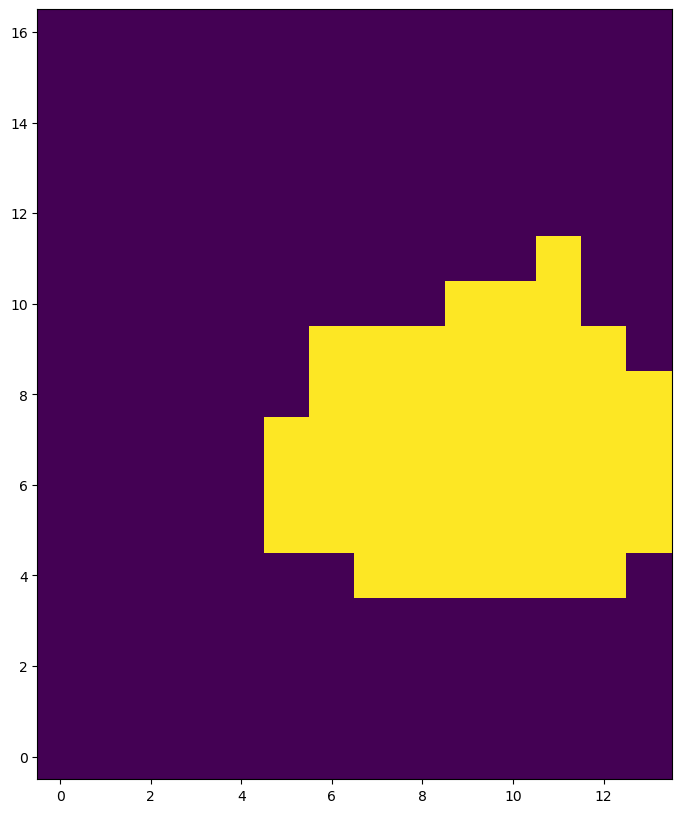

In [15]:
fig, ax = plt.subplots(figsize=(14, 10))
heatmap = ax.imshow(binary_mask_tc, cmap='viridis', origin='lower') 

#binary_mask_tc

In [16]:
# ##Ranking Method continued##

# def find_smallest_set(ranks_2d, ds_CF):
#     '''This function will iteratively test whether adding grid cells meets the criteria.'''
    
#     #Flatten the 2D ranks array and sort by rank ascending#
#     ranked_cells = np.dstack(np.unravel_index(np.argsort(ranks_2d.ravel()), ranks_2d.shape))[0]
    
#     #Initialize a set to keep track of which CF cases have been covered#
#     covered_cases = np.zeros(ds_CF.sizes['time'], dtype=bool)
    
#     #Initialize a list to hold the indices of cells in the smallest set#
#     smallest_set_indices = []
    
#     #Iterate over cells starting from the highest rank#
#     for cell_index in ranked_cells:
    
#         lat_idx, lon_idx = cell_index
        
#         #Update the coverage for this cell#
#         new_coverage = ds_CF['CF_Dataset'][:, lat_idx, lon_idx].values.astype(bool)
#         potential_covered_cases = covered_cases | new_coverage  #Potential new coverage
        
#         #Only add this cell if it increases the coverage#
#         if not np.array_equal(potential_covered_cases, covered_cases):
#             covered_cases = potential_covered_cases  #Update the coverage
#             smallest_set_indices.append(cell_index)  #Add the cell to the smallest set
        
#         #Check if all cases are covered#
#         if covered_cases.all():
#             break
    
#     return smallest_set_indices

# smallest_set = find_smallest_set(ranks_2d, ds_CF)
# #smallest_set

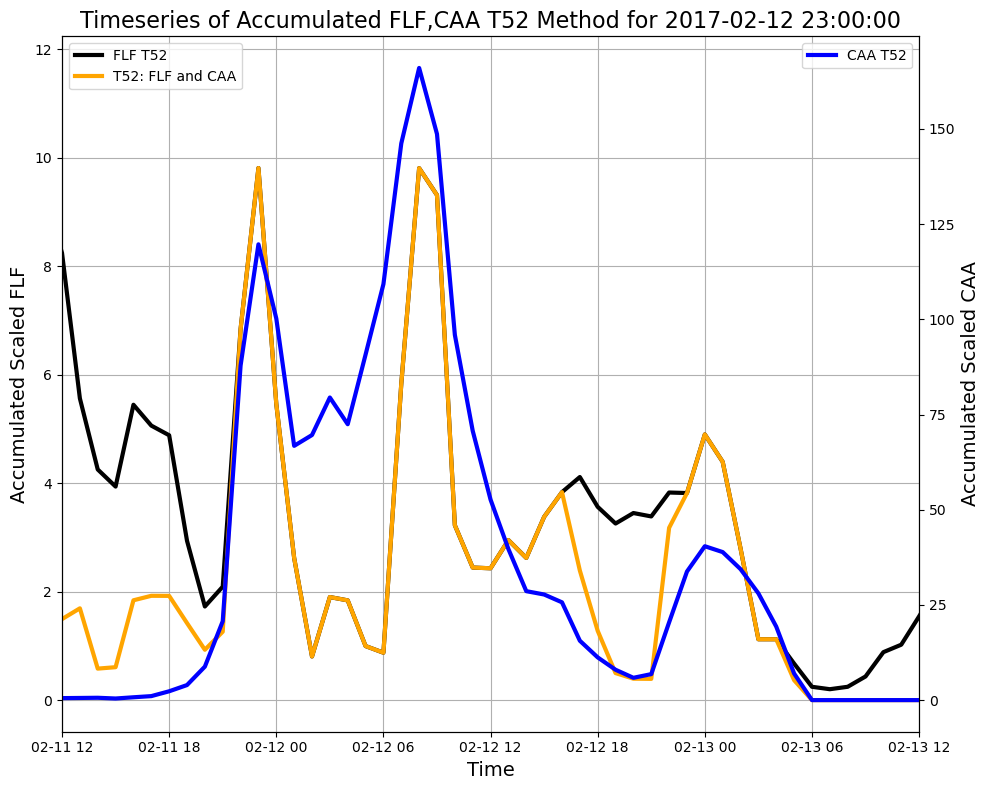

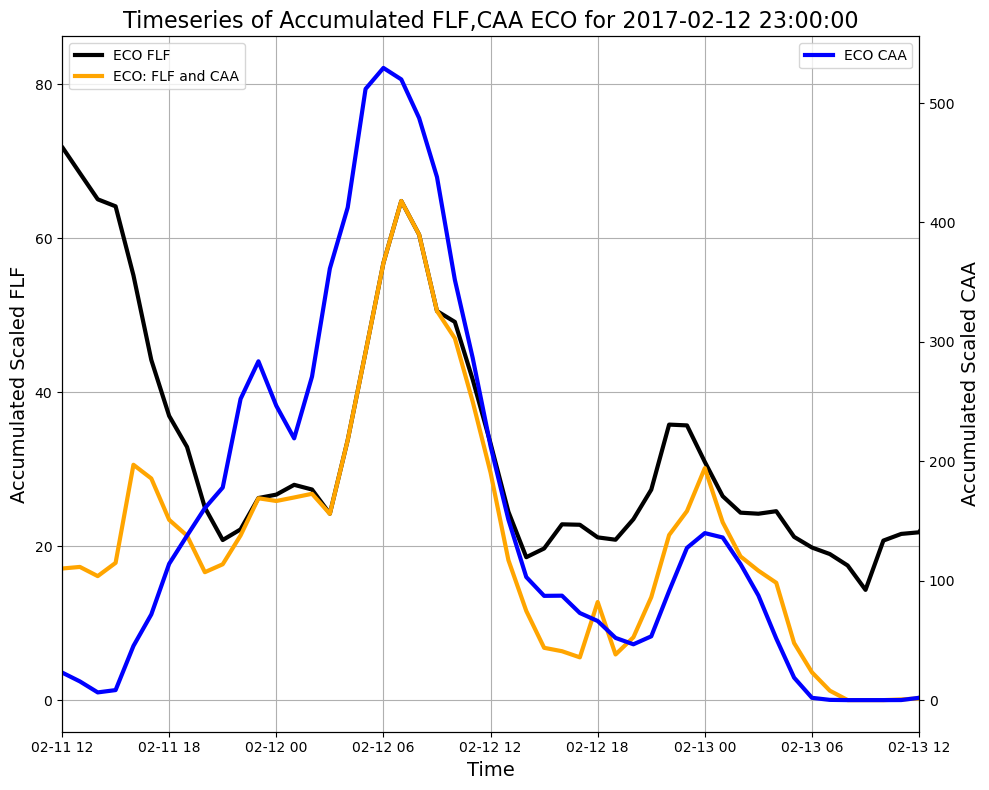

In [17]:
##We want to extract the FLF values for the Eastern CO domain##

#First remove all the frontolysis values#
FLF_data_FG = FLF_data.where(FLF_data <= 0, other=np.nan)

#Obtain the CAA for Theta#
thetaE_CAA = thetaE_adv_s_CAA.copy()

#Define extents and subset#
ECO_area = [41, -105.25, 37, -102]  #Eastern CO  105.25
minimized_area = list(sub_test_optimize).copy()

FLF_ECO = FLF_data_FG.sel(latitude=slice(ECO_area[0],ECO_area[2]),longitude=slice(ECO_area[1],ECO_area[3]))
Max_FLF_ECO = FLF_data_FG.sel(latitude=slice(minimized_area[1],minimized_area[0]),longitude=slice(minimized_area[2],minimized_area[3]))
thetaE_CAA_ECO = thetaE_CAA.sel(latitude=slice(ECO_area[0],ECO_area[2]),longitude=slice(ECO_area[1],ECO_area[3]))

#Define a start date#
start_date = str(FLF_ECO['time'][0].values)

#Create a mask from the flagged grid cells to consider only#
# mask_gc = ds_CF['CF_Dataset'][280] == 1  #need to change
# FLF_flagonly = FLF_ECO * mask_gc

#Create a second permanent mask using the 52 highest freq. gridcells and subset data#
binary_mask_tcf = np.flipud(binary_mask_tc)

FLF_top52flag = FLF_ECO * binary_mask_tcf
thetaE_CAA_top52flag = thetaE_CAA_ECO * binary_mask_tcf

#Accumulate the FLF, ThetaEadv for the different regions#
FLF_accumulated_top52 = abs(FLF_top52flag).sum(dim=['latitude', 'longitude'])
FLF_accumulated_ECO = abs(FLF_ECO).sum(dim=['latitude', 'longitude'])
#FLF_accumulated_MAX = abs(Max_FLF_ECO).sum(dim=['latitude', 'longitude'])

thetaE_CAA_accumulated_ECO = abs(thetaE_CAA_ECO).sum(dim=['latitude', 'longitude'])
thetaE_CAA_accumulated_top52 = abs(thetaE_CAA_top52flag).sum(dim=['latitude', 'longitude'])

#Plotting with pandas dates#
dates = pd.date_range(start=start_date, periods=FLF_accumulated_top52.sizes['time'], freq='H')
dates = pd.to_datetime(dates)

FLF_timeseries = pd.Series(data=FLF_accumulated_top52.values, index=dates)
FLF_timeseries2 = pd.Series(data=thetaE_CAA_accumulated_top52.values, index=dates)
FLF_timeseries3 = pd.Series(data=FLF_accumulated_ECO.values, index=dates)
FLF_timeseries4 = pd.Series(data=thetaE_CAA_accumulated_ECO.values, index=dates)
#FLF_timeseries5 = pd.Series(data=FLF_accumulated_MAX.values, index=dates)

 #Try an overlap with FLF and CAA now#

#Create a new DataArray that only contains FLF values where CAA is non-zero#
FLF_and_CAA = xr.where(thetaE_CAA_top52flag.values < 0, FLF_top52flag, 0)  
FLF_CAA_accumulated = abs(FLF_and_CAA).sum(dim=['latitude', 'longitude'])
FLF_CAA_timeseries = pd.Series(data=FLF_CAA_accumulated.values, index=dates)

FLF_and_CAA_ECO = xr.where(thetaE_CAA_ECO.values < 0, FLF_ECO, 0)  
FLF_CAA_accumulated_ECO = abs(FLF_and_CAA_ECO).sum(dim=['latitude', 'longitude'])
FLF_CAA_timeseries_ECO = pd.Series(data=FLF_CAA_accumulated_ECO.values, index=dates)

 #Plotting#

#Make plot 1 for T52#
fig, ax = plt.subplots(figsize=(10,8))
ax2 = ax.twinx() 
ax.plot(FLF_timeseries.index, FLF_timeseries.values, linewidth=3, color='black', label='FLF T52')
ax2.plot(FLF_timeseries2.index, FLF_timeseries2.values, linewidth=3, color='blue', label='CAA T52')
ax.plot(FLF_CAA_timeseries.index, FLF_CAA_timeseries.values, linewidth=3, color='orange', label='T52: FLF and CAA')

ax.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.xticks(rotation=45)
ax.set_xlabel('Time', fontsize=14)
ax.set_ylabel('Accumulated Scaled FLF', fontsize=14)
ax2.set_ylabel('Accumulated Scaled CAA', fontsize=14)  #Label for the second y-axis
ax.set_title(f'Timeseries of Accumulated FLF,CAA T52 Method for {dates[47]}', fontsize=16)  #change
ax.set_xlim([dates[12],dates[60]])
ax.grid(True)  
plt.tight_layout()  

#Make plot 2 for Eastern CO#
fig, ax = plt.subplots(figsize=(10,8))
ax2 = ax.twinx() 
ax.plot(FLF_timeseries3.index, FLF_timeseries3.values, linewidth=3, color='black', label='ECO FLF')
ax2.plot(FLF_timeseries4.index, FLF_timeseries4.values, linewidth=3, color='blue', label='ECO CAA')
ax.plot(FLF_CAA_timeseries_ECO.index, FLF_CAA_timeseries_ECO.values, linewidth=3, color='orange', label='ECO: FLF and CAA')

ax.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.xticks(rotation=45)
ax.set_xlabel('Time', fontsize=14)
ax.set_ylabel('Accumulated Scaled FLF', fontsize=14)
ax2.set_ylabel('Accumulated Scaled CAA', fontsize=14)  #Label for the second y-axis
ax.set_title(f'Timeseries of Accumulated FLF,CAA ECO for {dates[47]}', fontsize=16)  #change
ax.set_xlim([dates[12],dates[60]])
ax.grid(True)  
plt.tight_layout()  

plt.show()

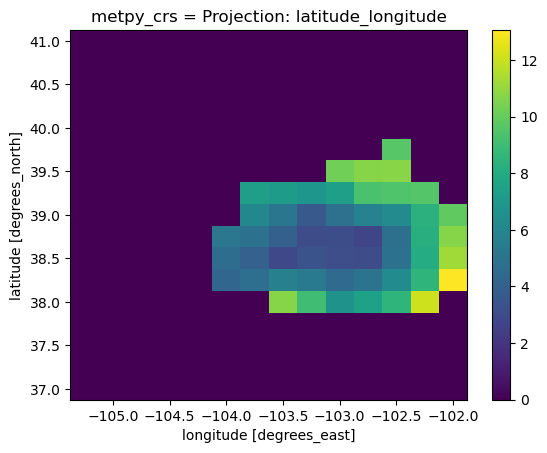

In [18]:
hiiii = abs(FLF_top52flag).sum(dim=['time'])

hiiii.plot()

In [19]:
##Average over the plotted FLF values to obtain a CF centroid##

def CF_centroid(data_arr, lats, lons):
    '''This function will take a spatial data array, 
        remove the nans, and create a centroid.'''
    
    #Format Data
    FLF_max = data_arr.copy()  #Max timestep for this CF event
    latitudes = lats.copy()
    longitudes = lons.copy()

    #Create a mask for non-NaN values
    mask_centroid = ~np.isnan(FLF_max)

    #Calculate the sum of non-NaN values for latitude and longitude
    lat_sum = (latitudes * mask_centroid).sum()
    lon_sum = (longitudes * mask_centroid).sum()
    coords_count = mask_centroid.sum()

    #Calculate the centroids (mean latitude and longitude of non-NaN values)
    lat_centroid = (lat_sum / coords_count).values
    lon_centroid = (lon_sum / coords_count).values
    
    return lat_centroid, lon_centroid

lat_c, lon_c = CF_centroid(FLF_ECO[23], FLF_ECO.latitude, FLF_ECO.longitude)
print(f"lat centroid: {lat_c}, lon centroid: {lon_c}")


def weighted_CF_centroid(data_arr, lats, lons, power=1):
    '''This function will take a spatial data array, 
        remove the nans, calculate a weight based on 
        FLF magnitude and create a centroid.'''
    
    #Flatten data#
    data_arr_flattened = data_arr.values.flatten()
    
    #Mask out Nans and filter FLF values, power controls weighting#
    mask = ~np.isnan(data_arr_flattened)
    masked_FLF = np.power(data_arr_flattened[mask], power)
    
    #Generate indices for the flattened array#
    lat_indices, lon_indices = np.indices(data_arr.shape)
    
    #Flatten the indices and apply the mask#
    masked_lats = lats[lat_indices.flatten()[mask]]
    masked_lons = lons[lon_indices.flatten()[mask]]

    #Calculate the weighted sum of FLF values#
    lat_weighted_sum = np.sum(masked_lats * masked_FLF)
    lon_weighted_sum = np.sum(masked_lons * masked_FLF)

    #Calculate the sum of the weights (FLF values)#
    total_FLF = np.sum(masked_FLF)

    #Calculate the weighted centroids#
    lat_centroid_wgt = lat_weighted_sum / total_FLF
    lon_centroid_wgt = lon_weighted_sum / total_FLF
    
    return lat_centroid_wgt, lon_centroid_wgt

lat_cw, lon_cw = weighted_CF_centroid(FLF_top52flag[25], FLF_top52flag.latitude.values, FLF_top52flag.longitude.values)
lat_cw2, lon_cw2 = weighted_CF_centroid(FLF_top52flag[25], FLF_top52flag.latitude.values, FLF_top52flag.longitude.values, power=2)
print(f"Weighted lat centroid: {lat_cw}, Weighted lon centroid: {lon_cw}")

lat centroid: 38.94444444444444, lon centroid: -103.7202380952381
Weighted lat centroid: 38.35501017012753, Weighted lon centroid: -103.67856350233045


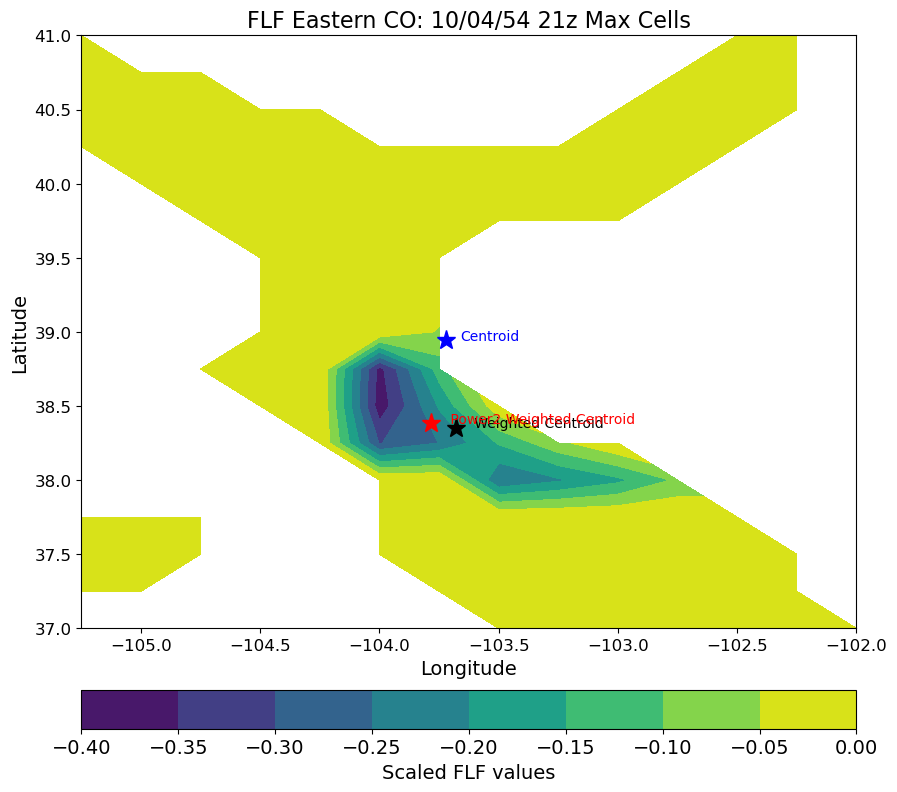

In [20]:
##Plot what the FLF would look like for Eastern CO and sum up values##

#Plotting##
fig, ax = plt.subplots(1, figsize=(10,10))
cf_FLF = plt.contourf(FLF_top52flag.longitude, FLF_top52flag.latitude, FLF_top52flag[25], cmap='viridis', alpha=1)
cbar = plt.colorbar(cf_FLF, orientation='horizontal', pad=0.08)

#Plot point for CF centroid
ax.plot(lon_c, lat_c, 'b*', markersize=14)
ax.text(lon_c + 0.06, lat_c, 'Centroid', color='blue')

#Plot point for weighted CF centroid
ax.plot(lon_cw, lat_cw, '*', markersize=14, color='black')
ax.text(lon_cw + 0.06, lat_cw, ' Weighted Centroid', color='black')

#Plot point for double weighted CF centroid
ax.plot(lon_cw2, lat_cw2, '*', markersize=14, color='red')
ax.text(lon_cw2 + 0.06, lat_cw2, ' Power2 Weighted Centroid', color='red')

ax.set_xlabel('Longitude', fontsize=14)
ax.set_ylabel('Latitude', fontsize=14)
ax.set_title('FLF Eastern CO: 10/04/54 21z Max Cells', fontsize=16)
ax.set_xlim([-105.25, -102])  #can turn off
ax.set_ylim([37,41])          #can turn off
ax.tick_params(labelsize=12)
cbar.set_label(label='Scaled FLF values', size=14)
cbar.ax.tick_params(labelsize=14)
#cbar.ax.set_xlim(-4, 0)

plt.show()


NameError: name 'FLF_flagonly' is not defined

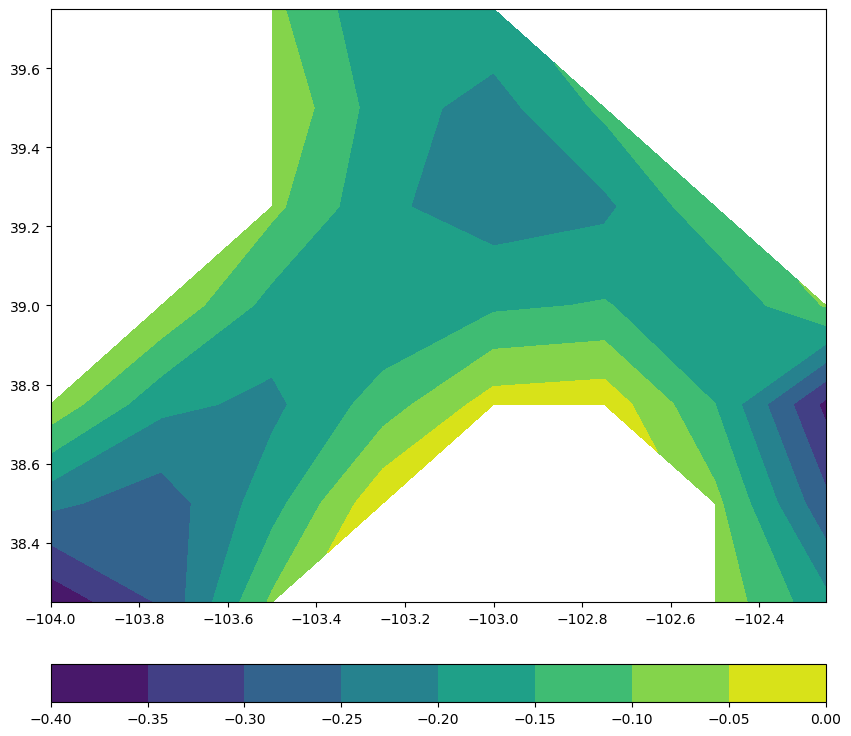

In [21]:
# Assuming FLF_ECO has a time dimension in hours since 00z 12/22/22
start_time = pd.to_datetime('2022-12-21 00:00')  # Start time of your dataset

# Function to convert index to time string
def index_to_time(index, start_time):
    time_step = pd.Timedelta(hours=int(index))
    actual_time = start_time + time_step
    return actual_time.strftime('%m/%d/%y %Hz')

# Plotting code, now with dynamic title
for i in range(48):  # Assuming you want to loop through all timesteps
    
    #Plot the FLF#
    fig, ax = plt.subplots(1, figsize=(10,10))
    cf_FLF = plt.contourf(Max_FLF_ECO.longitude, Max_FLF_ECO.latitude, Max_FLF_ECO[i], cmap='viridis', alpha=1)
    cbar = plt.colorbar(cf_FLF, orientation='horizontal', pad=0.08)  
    
    #Plot the centroids#
    lat_c, lon_c = CF_centroid(FLF_flagonly[i], FLF_flagonly.latitude, FLF_flagonly.longitude)
    ax.plot(lon_c, lat_c, 'b*', markersize=14)
    ax.text(lon_c + 0.06, lat_c, 'Centroid', color='blue')
    
    #Plot the weighted centroids#
    lat_cw, lon_cw = weighted_CF_centroid(FLF_flagonly[i], FLF_flagonly.latitude, FLF_flagonly.longitude)
    ax.plot(lon_cw, lat_cw, '*', markersize=14, color='black')
    ax.text(lon_cw + 0.06, lat_cw, 'Weighted Centroid', color='black')

    ax.set_xlabel('Longitude', fontsize=14)
    ax.set_ylabel('Latitude', fontsize=14)
    current_time = index_to_time(i, start_time)  # Convert index to actual time
    ax.set_title(f'FLF Eastern CO: {current_time}', fontsize=16)  # Dynamic title
    ax.tick_params(labelsize=12)
    cbar.set_label(label='Scaled FLF values', size=14)
    cbar.ax.tick_params(labelsize=14)

    plt.show()

In [ ]:
##Plot a histogram of all the FLF values at all 48 hour timesteps##

FLF_vals = FLF_ECO.copy().values.ravel()
#FLF_clean = FLF_vals[~np.isnan(FLF_vals)]  #Take out NaNs

#Plotting time#
fig, ax = plt.subplots(1, figsize=(12, 8))

#FLF values in Eastern CO domain#
ax.hist(FLF_vals, bins=30, color='skyblue', edgecolor='black')
ax.set_title('Eastern CO FLF 12/21 0z - 12/23 0z', fontsize=18)
ax.set_xlabel('FLF Values (K/m^3 * 1e14)', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.set_xlim([-6.0,0])  #-0.5

plt.tight_layout() 
plt.show()